# Stilometrie mit Python I

In [2]:
import pandas as pd
import plotly.graph_objects as go
import statistics as stats
import numpy as np
import os

Wir arbeiten hier mit gescrapten Texten. Ich verwende die, die ich für die sechste Sitzung mit dem Scraper für fanfiction.net gesammelt und für die siebte Sitzung mit Stanza annotiert habe – ihr könnt aber auch ganz andere ausprobieren.

Die annotierten Texte für dieses Notebook findet ihr im Archiv `ffnet_tagged_stanza.zip`.

In [4]:
directory = 'tagged-stanza'

`directory` gibt den Pfad zum Ordner an, in dem sich die annotierten Texte befinden. Diesen Pfad kann ggf. entsprechend angepasst werden. Die Texte liegen (beinahe) im CoNLL-U-Format vor. Da die Spalten hierbei implizit vorgegeben sind, haben die Tabellen keine Kopfzeile mit Spaltennamen, die wir deshalb beim Einlesen angeben müssen:

In [9]:
colnames = ['id', 'token', 'lemma', 'upos', 'xpos', 'feats', 'head', 'deprel', 'deps', 'misc']

Wir wollen uns hier erst einmal nur mit zwei ausgewählten Texten beschäftigen. Später vergleichen wir dann auch größere Mengen!

In [11]:
file = os.path.join(directory, '13243029.tsv')
table = pd.read_table(file, names=colnames, quoting=3, keep_default_na=False)

file2 = os.path.join(directory, '2173214.tsv')
table2 = pd.read_table(file2, names=colnames, quoting=3, keep_default_na=False)

`quoting=3` beim Einlesen sorgt dafür, dass Anführungszeichen in Tabellenfeldern nicht als *quote character* interpretiert werden – in unserem Fall würde sonst die Tabelle falsch eingelesen.

`keep_default_na=False` sorgt dafür, dass keine Zeichenfolgen in der Datei als `NaN` interpretiert werden. So wird z.B. der String `"null"` in der Token-Spalte nicht als `NaN` eingelesen.

In [13]:
table

,id,token,lemma,upos,xpos,feats,head,deprel,deps,misc
0,1,AN,a,DET,DT,Definite=Ind|PronType=Art,4,det,_,start_char=0|end_char=2
1,2,:,:,PUNCT,:,_,4,punct,_,start_char=2|end_char=3
2,3,Just,just,ADV,RB,_,4,advmod,_,start_char=4|end_char=8
3,4,something,something,PRON,NN,Number=Sing,0,root,_,start_char=9|end_char=18
4,5,I,I,PRON,PRP,Case=Nom|Number=Sing|Person=1|PronType=Prs,7,nsubj,_,start_char=19|end_char=20
...,...,...,...,...,...,...,...,...,...,...
52955,10,hell,hell,NOUN,NN,Number=Sing,4,ccomp,_,start_char=242696|end_char=242700
52956,11,of,of,ADP,IN,_,13,case,_,start_char=242701|end_char=242703
52957,12,a,a,DET,DT,Definite=Ind|PronType=Art,13,det,_,start_char=242704|end_char=242705
52958,13,night,night,NOUN,NN,Number=Sing,10,nmod,_,start_char=242706|end_char=242711


## Absolute und relative Häufigkeiten
Welche Wörter kommen wie oft vor (und welche sind am häufigsten)? Welche Wortarten kommen wie oft vor? Und was ist jeweils der Anteil an der Gesamtmenge?

### Häufigkeiten der Types
`.value_counts()` gibt absolute Häufigkeiten der Elemente einer `Series` (hier: einer Tabellenspalte) zurück.

Für relative Häufigkeiten muss man lediglich durch die Anzahl der Elemente teilen. Bei längeren Texten oder größeren Korpora ist es sinnvoll, die relativen Häufigkeiten pro tausend oder pro Million Tokens zu berechnen, weil die Anzahl der Nullen nach dem Komma (oder Punkt) die Zahlen sonst unübersichtlich macht.

In [15]:
upos_freq = table['upos'].value_counts()
upos_freq = 100 * upos_freq / sum(upos_freq) # prozentualer Anteil
upos_freq

upos
PUNCT    15.755287
PRON     13.740559
VERB     13.632931
NOUN     13.238293
ADP       8.640483
DET       7.162009
ADV       5.519260
ADJ       5.105740
AUX       4.939577
PROPN     3.702795
CCONJ     2.936178
PART      2.747356
SCONJ     2.179003
NUM       0.388973
INTJ      0.283233
X         0.024547
SYM       0.003776
Name: count, dtype: float64

In [17]:
type_freq = table['token'].str.lower().value_counts() # bei englischen Daten lohnt es sich u.U., alle Tokens in Kleinschreibung zu berücksichtigen – bei deutschen wäre ich vorsichtiger
type_freq = type_freq.to_frame()
type_freq = type_freq.reset_index()
type_freq.columns = ['type', 'count']
type_freq = type_freq.assign(rel=type_freq['count'] / len(table))
type_freq
# pd.crosstab(index=table['token'], columns='count').sort_values(by=['count'], ascending=False) # Alternative mit unpraktischen Spaltennamen

,type,count,rel
0,.,3508,0.066239
1,",",2619,0.049452
2,the,2193,0.041409
3,"""",1604,0.030287
4,her,1158,0.021866
...,...,...,...
4777,squish,1,0.000019
4778,ribs,1,0.000019
4779,withstand,1,0.000019
4780,dried,1,0.000019


Als Säulendiagramm:

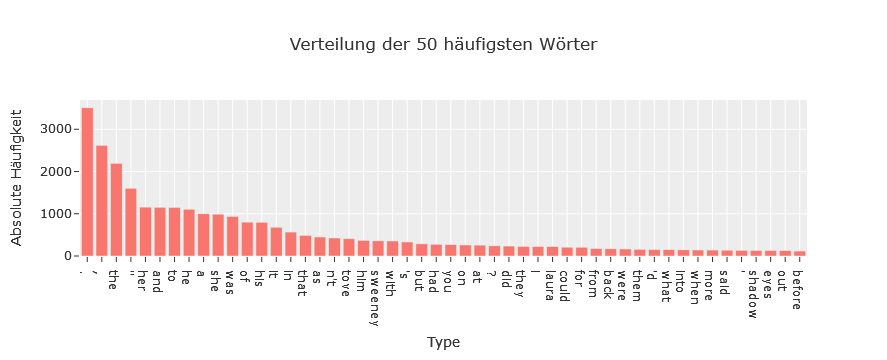

In [19]:
type_freq_50 = type_freq.iloc[0:50]
fig = go.Figure(data=go.Bar(x=type_freq_50['type'], y=type_freq_50['count']))
fig.update_layout(
    title="Verteilung der 50 häufigsten Wörter",
    xaxis_title="Type",
    yaxis_title="Absolute Häufigkeit",
    template="ggplot2"
)
fig.show()

### Zipfsches Gesetz
Häufigkeitsverteilungen der Typen natürlichsprachlicher Texte (und Textsammlungen) haben eine charakteristische Form: Sehr wenige Typen kommen extrem häufig vor, die Häufigkeit der nächsthäufigen Typen fällt rapide ab. Zipf (1949) hat den Zusammenhang zwischen Rang eines Wortes in der Frequenzliste und seiner Frequenz beschrieben: Die Frequenz ist umgekehrt proportional zum Rang.

Hier ist z.B. die [Häufigkeitsverteilung der Typen im Blog-Korpus des DWDS](https://kaskade.dwds.de/dstar/blogs/lexdb/view.perl?select=*&from=lex&where=&groupby=&orderby=f+DESC&offset=0&limit=100&_s=submit). Die Anzahl aller Token stammt von [hier](https://kaskade.dwds.de/dstar/blogs/lexdb/view.perl?select=SUM%28f%29&from=lex&where=&groupby=&orderby=f+DESC&offset=0&limit=100&_s=submit). (Wenn man die Links nun aufruft, erhält man etwas andere Werte, da das Korpus inzwischen erweitert wurde.)

In [21]:
dwds_blogs = pd.read_table('dwds_blogs_top100.tsv', quoting=3)
n_tokens = 104311271
dwds_blogs = dwds_blogs.assign(rel=dwds_blogs['freq'] / n_tokens)
dwds_blogs

,type,pos,lemma,freq,rel
0,",","$,",",",5282307,0.050640
1,.,$.,.,4552157,0.043640
2,und,KON,und,2026951,0.019432
3,die,ART,d,1768764,0.016957
4,der,ART,d,1639242,0.015715
...,...,...,...,...,...
95,Das,ART,d,119571,0.001146
96,was,PWS,was,118565,0.001137
97,diese,PDAT,diese,113925,0.001092
98,muss,VMFIN,müssen,112985,0.001083


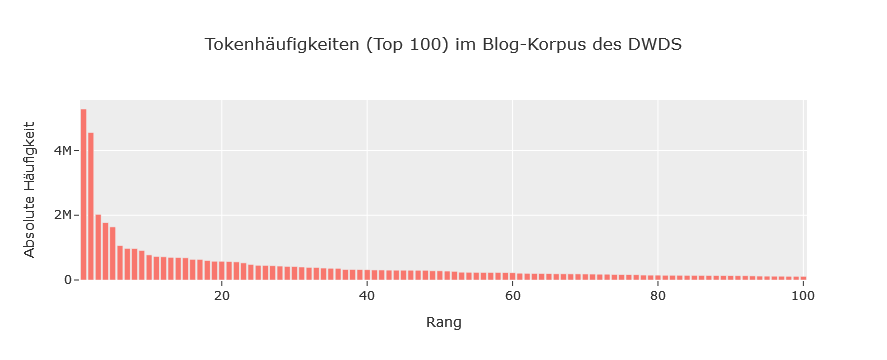

In [23]:
fig = go.Figure(data=go.Bar(x=np.arange(1, 101), y=dwds_blogs['freq']))
fig.update_layout(
    title="Tokenhäufigkeiten (Top 100) im Blog-Korpus des DWDS",
    xaxis_title="Rang",
    yaxis_title="Absolute Häufigkeit",
    template="ggplot2"
)
fig.show()

In doppelt-logarithmischer Darstellung ergibt sich eine annähernd lineare Beziehung. Deutliche Einschränkungen gibt es allerdings im Bereich der häufigsten und der seltensten Types (eine bessere Anpassung liefert das Zipf-Mandelbrot-Gesetz – [mehr dazu hier](http://zipfr.r-forge.r-project.org/materials/LREC2018/tutorial_lrec2018.handout.pdf)).

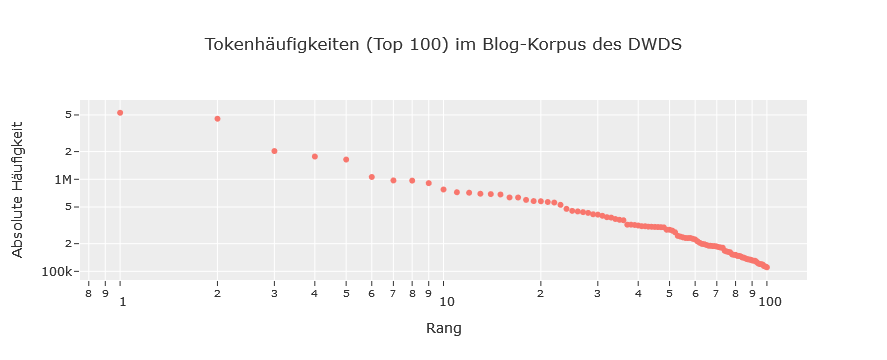

In [25]:
fig = go.Figure(data=go.Scatter(x=np.arange(1, 101), y=dwds_blogs['freq'], mode='markers'))
fig.update_layout(
    title="Tokenhäufigkeiten (Top 100) im Blog-Korpus des DWDS",
    xaxis_title="Rang",
    yaxis_title="Absolute Häufigkeit",
    template="ggplot2",
    xaxis_type="log",
    yaxis_type="log"
)
fig.show()

G. K. Zipf hatte ursprünglich festgestellt, dass das Produkt aus Rang und Häufigkeit näherungsweise konstant bleibt. Wir können dieselbe Berechnung leicht auf unseren Daten durchführen:

In [27]:
dwds_blogs = dwds_blogs.assign(zipf_const=dwds_blogs['freq'] * np.arange(1, 101))
dwds_blogs

,type,pos,lemma,freq,rel,zipf_const
0,",","$,",",",5282307,0.050640,5282307
1,.,$.,.,4552157,0.043640,9104314
2,und,KON,und,2026951,0.019432,6080853
3,die,ART,d,1768764,0.016957,7075056
4,der,ART,d,1639242,0.015715,8196210
...,...,...,...,...,...,...
95,Das,ART,d,119571,0.001146,11478816
96,was,PWS,was,118565,0.001137,11500805
97,diese,PDAT,diese,113925,0.001092,11164650
98,muss,VMFIN,müssen,112985,0.001083,11185515


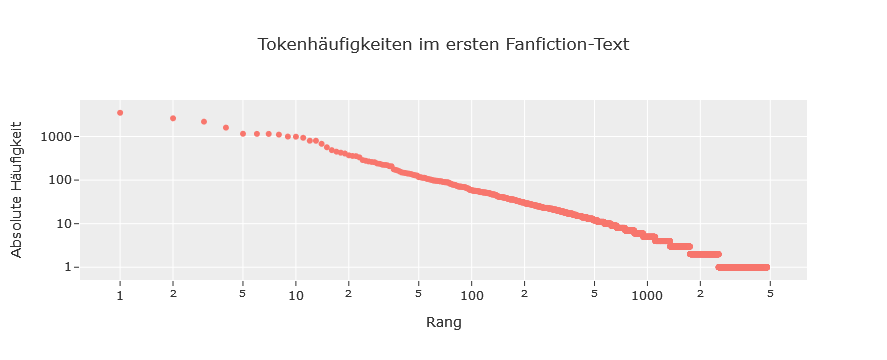

In [29]:
fig = go.Figure(data=go.Scatter(x=np.arange(1, len(type_freq) + 1), y=type_freq['count'], mode='markers'))
fig.update_layout(
    title="Tokenhäufigkeiten im ersten Fanfiction-Text",
    xaxis_title="Rang",
    yaxis_title="Absolute Häufigkeit",
    template="ggplot2",
    xaxis_type="log",
    yaxis_type="log"
)
fig.show()

> **Aufgabe**: Berechnet die „Zipf-Konstante“ für unsere beiden Fanfiction-Beispieltexte (`table` und `table2`). Plottet die Werte in geeigneter Form, um zu überprüfen, ob sie tatsächlich näherungsweise konstant sind.

### Häufigkeiten von Lemma-POS-Kombinationen
Sinnvoll kann es auch sein, sich als Typen Kombinationen aus Lemma und POS-Tag anzusehen (so lässt sich z.B. *to* als Präposition von *to* vor Infinitiven unterscheiden; allerdings nicht beim originalen Penn-Tagset, das für beide den Tag `TO` verwendet). Dieses Lexem-Konzept ist vor allem in der englischen Korpuslinguistik weit verbreitet:

In [31]:
type_freq = (table['lemma'].str.lower() + "/" + table['upos']).value_counts()
type_freq = type_freq.to_frame()
type_freq = type_freq.reset_index()
type_freq.columns = ['type', 'count']
type_freq = type_freq.assign(rel=type_freq['count'] / len(table))
type_freq

,type,count,rel
0,./PUNCT,3508,0.066239
1,",/PUNCT",2619,0.049452
2,the/DET,2193,0.041409
3,he/PRON,2188,0.041314
4,she/PRON,2070,0.039086
...,...,...,...
4308,episode/NOUN,1,0.000019
4309,star/PROPN,1,0.000019
4310,evening/PROPN,1,0.000019
4311,vechernyaya/PROPN,1,0.000019


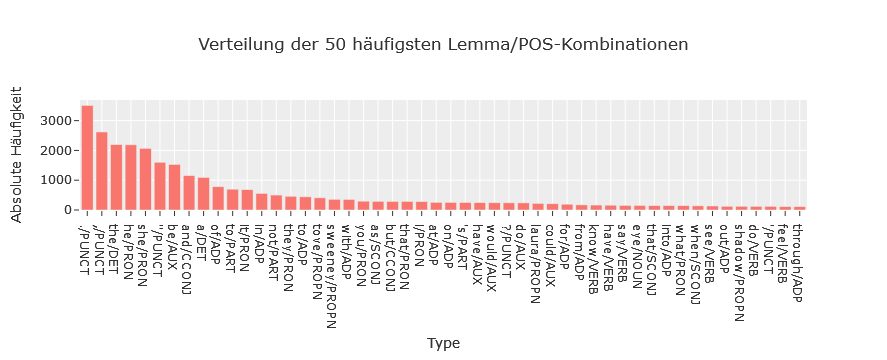

In [33]:
type_freq = type_freq.iloc[0:50]
fig = go.Figure(data=go.Bar(x=type_freq['type'], y=type_freq['count']))
fig.update_layout(
    title="Verteilung der 50 häufigsten Lemma/POS-Kombinationen",
    xaxis_title="Type",
    yaxis_title="Absolute Häufigkeit",
    template="ggplot2"
)
fig.show()

### Wortartenhäufigkeiten

Häufigkeitstabelle für Wortarten (grob klassifiziert mit dem UD-Tagset, Spalte `upos`):

In [35]:
upos_freq = table['upos'].value_counts()
upos_freq = upos_freq.to_frame()
upos_freq = upos_freq.reset_index()
upos_freq.columns = ['upos', 'count']
upos_freq = upos_freq.assign(rel=upos_freq['count'] / len(table))
upos_freq

,upos,count,rel
0,PUNCT,8344,0.157553
1,PRON,7277,0.137406
2,VERB,7220,0.136329
3,NOUN,7011,0.132383
4,ADP,4576,0.086405
5,DET,3793,0.071620
6,ADV,2923,0.055193
7,ADJ,2704,0.051057
8,AUX,2616,0.049396
9,PROPN,1961,0.037028


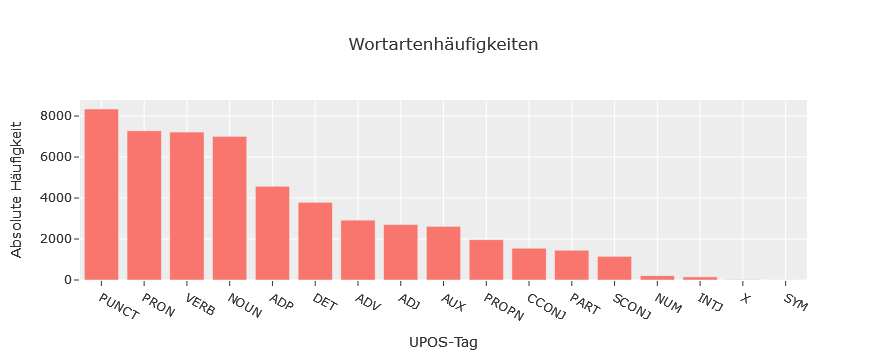

In [37]:
fig = go.Figure(data=go.Bar(x=upos_freq['upos'], y=upos_freq['count']))
fig.update_layout(
    title="Wortartenhäufigkeiten",
    xaxis_title="UPOS-Tag",
    yaxis_title="Absolute Häufigkeit",
    template="ggplot2"
)
fig.show()

Relative Häufigkeiten:

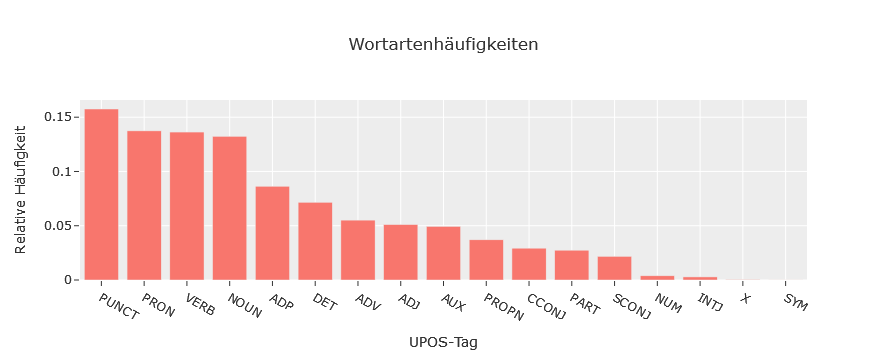

In [39]:
fig = go.Figure(data=go.Bar(x=upos_freq['upos'], y=upos_freq['rel']))
fig.update_layout(
    title="Wortartenhäufigkeiten",
    xaxis_title="UPOS-Tag",
    yaxis_title="Relative Häufigkeit",
    template="ggplot2"
)
fig.show()

> **Aufgabe:** Ihr verliert allmählich die Freude am Copy & Paste. Schreibt eine Funktion, die für eine Tabellen-Spalte (oder einen abgeleiteten Vektor wie die Lemma/POS-Kombination) eine Häufigkeitstabelle erstellt und die relativen Häufigkeiten berechnet. Vielleicht kann sie diese sogar mit der Option `plot=True` gleich visualisieren.

Schließlich kann es auch noch interessant sein, die häufigsten Wortform- oder Lemma-Typen für eine bestimmte Wortart zu ermitteln:

In [41]:
type_freq_aux = table.query('upos == "AUX"')['token'].str.lower().value_counts().to_frame().reset_index()
type_freq_aux.columns = ['token', 'count']
type_freq_aux = type_freq_aux.assign(rel=type_freq_aux['count'] / len(table))
type_freq_aux

,token,count,rel
0,was,881,0.016635
1,could,209,0.003946
2,did,178,0.003361
3,had,162,0.003059
4,were,155,0.002927
5,'d,150,0.002832
6,been,104,0.001964
7,would,93,0.001756
8,'s,85,0.001605
9,be,84,0.001586


## Umfang und Vielfältigkeit des Vokabulars
Um Satzzeichen auszuschließen:

In [43]:
only_words = table.query('upos != "PUNCT"') # alternativ: table[table['upos'] != 'PUNCT']
only_words2 = table2.query('upos != "PUNCT"')

Kleinschreibung von Token und Kombination mit Wortarten als neue Spalte hinzufügen:

In [45]:
only_words = only_words.assign(token_upos=only_words['token'].str.lower() + "/" + only_words['upos'])
only_words2 = only_words2.assign(token_upos=only_words2['token'].str.lower() + "/" + only_words2['upos'])
only_words

,id,token,lemma,upos,xpos,feats,head,deprel,deps,misc,token_upos
0,1,AN,a,DET,DT,Definite=Ind|PronType=Art,4,det,_,start_char=0|end_char=2,an/DET
2,3,Just,just,ADV,RB,_,4,advmod,_,start_char=4|end_char=8,just/ADV
3,4,something,something,PRON,NN,Number=Sing,0,root,_,start_char=9|end_char=18,something/PRON
4,5,I,I,PRON,PRP,Case=Nom|Number=Sing|Person=1|PronType=Prs,7,nsubj,_,start_char=19|end_char=20,i/PRON
5,6,'m,be,AUX,VBP,Mood=Ind|Tense=Pres|VerbForm=Fin,7,aux,_,start_char=20|end_char=22,'m/AUX
...,...,...,...,...,...,...,...,...,...,...,...
52954,9,a,a,DET,DT,Definite=Ind|PronType=Art,10,det,_,start_char=242694|end_char=242695,a/DET
52955,10,hell,hell,NOUN,NN,Number=Sing,4,ccomp,_,start_char=242696|end_char=242700,hell/NOUN
52956,11,of,of,ADP,IN,_,13,case,_,start_char=242701|end_char=242703,of/ADP
52957,12,a,a,DET,DT,Definite=Ind|PronType=Art,13,det,_,start_char=242704|end_char=242705,a/DET


### Type-Token-Verhältnis

In [51]:
n_types1 = len(set(only_words['token_upos']))
n_tokens1 = len(only_words['token_upos'])
n_types2 = len(set(only_words2['token_upos']))
n_tokens2 = len(only_words2['token_upos'])

def ttr(n_types, n_tokens):
    '''Type-token ratio'''
    return n_types / n_tokens

print(ttr(n_types1, n_tokens1))
print(ttr(n_types2, n_tokens2))

0.1182983682983683
0.247180667433832


> **Aufgabe:** Wie interpretiert ihr diese Werte? Ist der Unterschied tatsächlich auf den Stil der beiden Texte zurückzuführen oder könnte es noch andere Faktoren geben?

### Vokabularwachstum
Je länger ein Text wird, desto mehr unterschiedliche Wörter enthält er in der Regel. Allerdings kommen auch immer weniger neue Wörter hinzu, je länger ein Text wird – irgendwann sind die meisten Wörter, die hinzukommen, Wiederholungen.

Man kann das gut graphisch mit einer Wachstumskurve darstellen. Auf der x-Achse sehen wir die Textlänge in Token, auf der y-Achse die Anzahl unterschiedlicher Wörter (Typen). Mit steigender Tokenzahl flacht die Kurve immer weiter ab.

In [54]:
def vocabulary_growth(tokens, mode='types'):
    results = []
    types = set()
    for i, token in enumerate(tokens):
        types.add(token)
        if mode == 'ttr':
            results.append(ttr(len(types), i + 1))
        else:
            results.append(len(types))
    return results

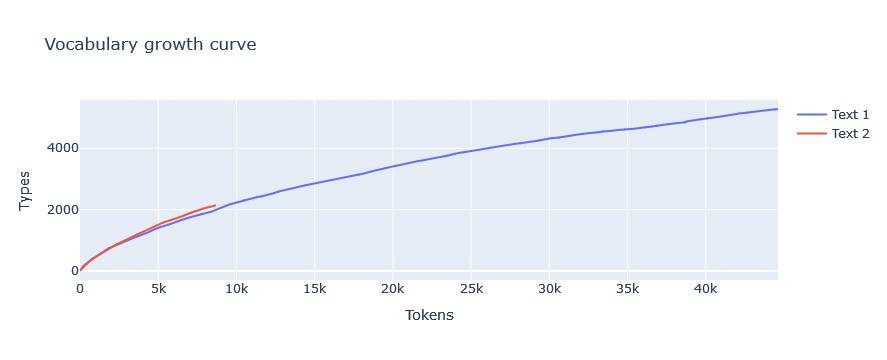

In [58]:
vc = vocabulary_growth(only_words['token_upos'])
vc2 = vocabulary_growth(only_words2['token_upos'])
# ow_random = only_words.sample(frac=1) # zufällige Verteilung der Tokens ('bag of words') => Einfluss auf die Kurve?
# vc3 = vocabulary_growth(ow_random['token_upos'])

plot = go.Figure(go.Scatter(x = np.arange(1, len(vc) + 1), y = vc, mode='lines', name='Text 1'))
plot.add_trace(go.Scatter(x = np.arange(1, len(vc2) + 1), y = vc2, mode='lines', name='Text 2'))
# scatterplot.add_trace(go.Scatter(x = np.arange(1, len(vc3) + 1), y = vc3, mode='lines', name='Text 1 (BoW)'))
plot.update_layout(
    title="Vocabulary growth curve",
    xaxis_title="Tokens",
    yaxis_title="Types")
plot.show()

Entsprechend sinkt das Type-Token-Verhältnis mit zunehmender Textlänge:

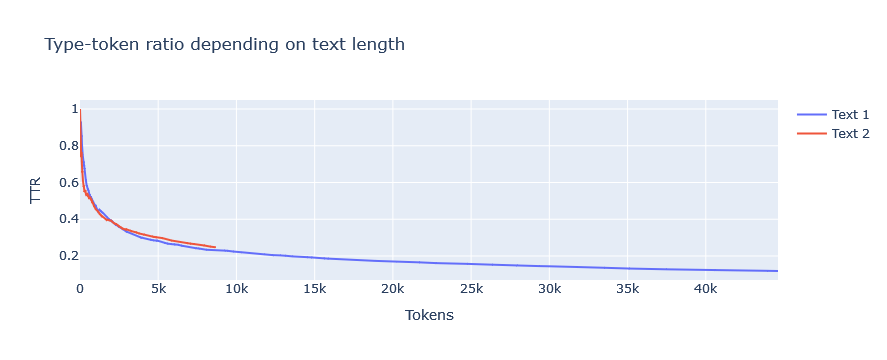

In [60]:
ttrs = vocabulary_growth(only_words['token_upos'], mode='ttr')
ttrs2 = vocabulary_growth(only_words2['token_upos'], mode='ttr')
# ttrs3 = vocabulary_growth(ow_random['token_upos'], mode='ttr')

plot = go.Figure(go.Scatter(x = np.arange(1, len(ttrs) + 1), y = ttrs, mode='lines', name='Text 1'))
plot.add_trace(go.Scatter(x = np.arange(1, len(ttrs2) + 1), y = ttrs2, mode='lines', name='Text 2'))
# scatterplot.add_trace(go.Scatter(x = np.arange(1, len(ttrs3) + 1), y = ttrs3, mode='lines', name='Text 1 (BoW)'))
plot.update_layout(
    title="Type-token ratio depending on text length",
    xaxis_title="Tokens",
    yaxis_title="TTR")
plot.show()

### Standardisiertes Type-Token-Verhältnis
Da das Type-Token-Verhältnis also von der Textlänge abhängt, ist es bei unterschiedlich langen Texten nicht sinnvoll, die TTR-Werte direkt miteinander zu vergleichen. Man kann sich aber (z.B.) mit dem standardisierten Type-Token-Verhältnis behelfen. Dazu wird jeder Text zuerst in "Fenster" gleicher Größe/Tokenzahl unterteilt (falls dabei am Ende Wörter übrigbleiben, die kein eigenes Fenster mehr füllen würden, werden diese ignoriert). Für jedes Fenster wird das Type-Token-Verhältnis ganz normal berechnet, sodass man so viele Werte erhält, wie es Fenster gibt. Von all diesen Werten wird dann das arithmetische Mittel gebildet (Summe aller Werte durch Anzahl der Werte).

In [62]:
def sttr(tokens, window_size=500):
    '''Standardised type-token ratio:
    Divide the text into sections of equal size, calculate TTR for each section, then return the arithmetic mean of all results.'''
    results = []
    for i in range(int(len(tokens) / window_size)):
        window_tokens = tokens[i*window_size:i*window_size + window_size]
        n_types = len(set(window_tokens))
        results.append(ttr(n_types, window_size))
    return stats.mean(results)

print('STTR auf Fenstergröße 500, Text 1:', sttr(only_words['token_upos']))
print('STTR auf Fenstergröße 500, Text 2:', sttr(only_words2['token_upos']))
print()
print('STTR auf Fenstergröße 4000, Text 1:', sttr(only_words['token_upos'], window_size=4000))
print('STTR auf Fenstergröße 4000, Text 2:', sttr(only_words2['token_upos'], window_size=4000))


STTR auf Fenstergröße 500, Text 1: 0.5429213483146068
STTR auf Fenstergröße 500, Text 2: 0.5472941176470588

STTR auf Fenstergröße 4000, Text 1: 0.3103409090909091
STTR auf Fenstergröße 4000, Text 2: 0.319625


### MTLD
MTLD steht für *measure of textual lexical diversity*. Die Idee dahinter ist ähnlich wie die hinter dem standardisierten Type-Token-Verhältnis, allerdings geht man umgekehrt vor: Statt die Länge von Textfenstern vorzugeben, gibt man ein bestimmtes Type-Token-Verhältnis als Schwellenwert vor (die Faktorgröße im Code unten). Dann durchläuft man den Text Token für Token und berechnet für jedes Token das aktuelle Type-Token-Verhältnis. Sobald es den festgelegten Schwellenwert erreicht oder unterschreitet, wird das aktuelle Fenster geschlossen und das Type-Token-Verhältnis beginnt wieder bei 1. Am Ende wird die Textlänge (in Tokens) durch die Zahl der Fenster geteilt – man erhält dann die durchschnittliche Fenstergröße, um ein bestimmtes Type-Token-Verhältnis zu erreichen.

Ein Vorteil gegenüber dem STTR-Ansatz oben ist, dass am Ende keine Token ignoriert werden: Alle Token gehen in die Berechnung ein (ggf. mit Hilfe eines Teilfaktors). Nachteile von MTLD sind, dass es sich um einen komplexen Algorithmus handelt, der mathematisch schwer zu interpretieren ist, und dass der Schwellenwert arbiträr vorgegeben werden muss.

Im Detail: https://link.springer.com/article/10.3758/BRM.42.2.381

In [64]:
def mtld(tokens, factor_size=.72):
    '''MTLD according to McCarthy & Jarvis (2010)'''
    if isinstance(tokens, pd.Series):
        tokens = tokens.tolist() # sonst funktioniert .reverse() nicht
    def mtldsub(tokens, factor_size, reverse=False):
        # Startwerte (types ist ein Set, kann also keine Duplikate enthalten):
        factors = 0
        types = set()
        token_count = 0
        if reverse:
            tokens.reverse()
        # Tokens durchgehen und der aktuellen Type-Menge hinzufügen:
        for token in tokens:
            types.add(token)
            token_count += 1
            # Falls TTR-Wert die festgelegte Faktorgröße erreicht oder unterschreitet,
            # Faktorzahl erhöhen und neue Type-Liste beginnen:
            if (len(types) / token_count) <= factor_size:
                factors += 1
                types = set()
                token_count = 0
        # Teilfaktor, falls am Ende noch Tokens übrig sind:
        if token_count > 0:
            TTR = len(types) / token_count
            factors += (1 - TTR) / (1 - factor_size) # Anteil des Wegs bis zum Schwellenwert
        # durchschnittliche Länge eines Faktors berechnen und zurückgeben
        return len(tokens) / factors
    # In beiden Richtungen durch den Text gehen, Mittelwert als Endergebnis zurückgeben:
    mtld_forward = mtldsub(tokens, factor_size)
    mtld_reverse = mtldsub(tokens, factor_size, reverse=True)
    return stats.mean([mtld_forward, mtld_reverse])

In [66]:
print('MTLD mit TTR-Schwellenwert 0.72, Text 1:', mtld(only_words['token_upos']))
print('MTLD mit TTR-Schwellenwert 0.72, Text 2:', mtld(only_words2['token_upos']))
print()
print('MTLD mit TTR-Schwellenwert 0.5, Text 1:', mtld(only_words['token_upos'], factor_size=.5))
print('MTLD mit TTR-Schwellenwert 0.5, Text 2:', mtld(only_words2['token_upos'], factor_size=.5))

MTLD mit TTR-Schwellenwert 0.72, Text 1: 116.99806209272514
MTLD mit TTR-Schwellenwert 0.72, Text 2: 111.40170959179852

MTLD mit TTR-Schwellenwert 0.5, Text 1: 703.6138906005908
MTLD mit TTR-Schwellenwert 0.5, Text 2: 728.494760282498


> **Aufgabe:** Wie interpretiert ihr dieses Ergebnis?

## Satzlängen
Interessant könnte auch die durchschnittliche Satzlänge als grobes Maß für syntaktische Komplexität sein. Da wir die analysierten Texte nicht in einem korrekten CoNLL-Format mit Leerzeilen als Satzgrenzen gespeichert haben, müssen wir uns mit einem Trick behelfen, um Satzgrenzen zu identifizieren:

In [68]:
sentence_lengths = []
lastid = table['id'].last_valid_index()
for index, value in table['id'].items():
    # Die Idee hier ist, die id-Spalte von oben nach unten durchzugehen.
    # Bei jedem neuen Satz beginnen die Werte wieder bei 1.
    if value == 1:
        if index != 0:
            sentence_lengths.append(sentence_length)
        sentence_length = 1
    else:
        sentence_length += 1
    if index == lastid:
        sentence_lengths.append(sentence_length)

> **Aufgabe:** Es wäre natürlich leicht möglich, das korrekte CoNLL-U-Format zu erstellen (wie in der letzten Sitzung gezeigt). Allerdings könnten wir die Texte dann nicht mehr mit der `read_table()`-Methode einlesen (warum?).
> 1. Warum wäre es nicht effizient, zum Einlesen das [CoNLL-U-Paket](https://pypi.org/project/conllu/) zu verwenden?
> 2. Wie könnten wir die Satzinformation trotzdem explizit in unser einfaches Tabellenformat einbauen?
> 3. Diese Repräsentation hat auch Vorteile gegenüber einer direkten Berechnung von Satzlängen mit dem oben gezeigten Code. Implementiert eine Funktion, die eine gegebene Token-Tabelle um Satzinformation ergänzt. 

In [70]:
stats.mean(sentence_lengths)

13.723762632806427

In [72]:
stats.median(sentence_lengths)

12

Dass der Mittelwert hier größer ist als der Median, gibt uns bereits einen Hinweis darauf, dass die Verteilung der Satzlängen rechtsschief ist, also auf der rechten Seite flacher abfällt. Das ergibt Sinn: Sowohl sehr kurze als auch sehr lange Sätze sind selten, aber die Kürze der Sätze ist nach unten begrenzt (kürzer als ein Wort geht nicht), nach oben aber nicht.

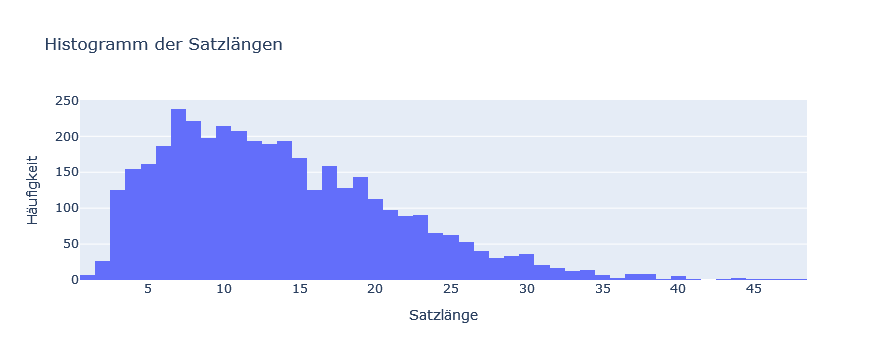

In [74]:
fig = go.Figure(data=[go.Histogram(x=sentence_lengths)])
fig.update_layout(
    title="Histogramm der Satzlängen",
    xaxis_title="Satzlänge",
    yaxis_title="Häufigkeit",)
fig.show()

Später können wir uns ansehen, ob uns die Informationen aus dem Dependenzparsing noch bessere Informationen über die Satzkomplexität liefern.

Kleiner Exkurs: Statt die Satzlängen wie oben zu berechnen, kann man auch elegant mit pandas Satz-IDs als Spalte hinzufügen:

In [76]:
table['sentence'] = table.id.apply(lambda x: x==1).cumsum()

In [36]:
table

,id,token,lemma,upos,xpos,feats,head,deprel,deps,misc,sentence
0,1,AN,a,DET,DT,Definite=Ind|PronType=Art,4,det,_,start_char=0|end_char=2,1
1,2,:,:,PUNCT,:,_,4,punct,_,start_char=2|end_char=3,1
2,3,Just,just,ADV,RB,_,4,advmod,_,start_char=4|end_char=8,1
3,4,something,something,PRON,NN,Number=Sing,0,root,_,start_char=9|end_char=18,1
4,5,I,I,PRON,PRP,Case=Nom|Number=Sing|Person=1|PronType=Prs,7,nsubj,_,start_char=19|end_char=20,1
...,...,...,...,...,...,...,...,...,...,...,...
52955,10,hell,hell,NOUN,NN,Number=Sing,4,ccomp,_,start_char=242696|end_char=242700,3859
52956,11,of,of,ADP,IN,_,13,case,_,start_char=242701|end_char=242703,3859
52957,12,a,a,DET,DT,Definite=Ind|PronType=Art,13,det,_,start_char=242704|end_char=242705,3859
52958,13,night,night,NOUN,NN,Number=Sing,10,nmod,_,start_char=242706|end_char=242711,3859


So können wir die Satzlängen erhalten, indem wir die Häufigkeiten der neu berechneten Satz-IDs berechnen (und sie ggf. durch Sortierung nach Satz-ID wieder in die richtige Reihenfolge bringen).

In [78]:
table['sentence'].value_counts()

sentence
2440    48
2161    47
1128    46
3023    45
3584    44
        ..
1427     1
1054     1
847      1
1686     1
846      1
Name: count, Length: 3859, dtype: int64

> **Aufgaben:** 
> 1. Welche anderen textstatistischen Maße könnt ihr noch relativ einfach aus den mit Stanza analysierten Texten berechnen?
> 2. Erstellt eine Tabelle, in der eine Auswahl der Maße für jeden Text (= Tabellenspalte) zusammengestellt ist, und versucht, Auszüge aus der Tabelle zu visualisieren.